<a href="https://colab.research.google.com/github/RahulJuluru2/unit4assignments/blob/main/U4W22_53_Siamese_C_RJ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Advanced Certification in AIML
## A Program by IIIT-H and TalentSprint

### Learning Objectives

At the end of the experiment, you will be able to:

* Understand the challenges of facial recognition and the IMFDB dataset
* Be able to use the Siamese network to get similarity score between images
* Classify the IMFDB dataset using MLP by using the features obtained from Siamese Network


In [ ]:
#@title Experiment Explanation Video
from IPython.display import HTML

HTML("""<video width="850" height="480" controls>
  <source src="https://cdn.talentsprint.com/aiml/AIML_BATCH_HYD_7/Apr15/siamese_exp_walkthrough2.mp4" type="video/mp4">
</video>
""")

### Dataset

#### Description

Indian Movie Face database (IMFDB) is a large unconstrained face database **consisting of 34512 images of 100 Indian actors collected from more than 100 videos. (For this experiment we are using data of 16 actors, which results in 5000 training samples and 1095 testing samples.)**  
* Faces in IMFDB are collected from Indian movie videos. Faces in movie videos arguably have large variations in scale, pose, expression, illumination, age, resolution, occlusion, and makeup.
* Videos collected from the last two decades contain large diversity in age variations compared to the images collected from the Internet through a search query.
* Public figures often retain certain kinds of appearance, dress patterns, and expressions when appearing in public while movie videos offer greater variations.
* IMFDB is built by manual selection and cropping of video frames resulting in a large spectrum of poses to develop efficient algorithms to handle pose.

The image below contains few sample faces from the dataset:

<img src = "http://cvit.iiit.ac.in/projects/IMFDB/faces5.png">

Design guidelines followed in the database are:

* **Selection of movies and actors**: To ensure diversity in the appearance of actors, movies are selected from 5 Indian languages namely, Hindi, Telugu, Kannada, Malayalam, and Bengali. For each actor, movies are selected such that they give wide variations in age.
* **Selection of frames**:  Often, a single frame is selected from a shot (scene) unless there is another frame with a significant difference from the previously selected frame. If there are multiple variations available in a shot, face with occlusion and pose variation, were preferred. Small faces that are difficult to recognize manually are not considered.
* **Cropping of faces**: Faces are cropped with a tight bounding box. To maintain consistency across images, we followed a heuristic of cropping the face from forehead to chin.
* **Annotation**: For every image, annotation is provided for the following attributes:

> 
    Expressions     :  Anger, Happiness, Sadness, Surprise, Fear, Disgust
    Illumination    :  Bad, Medium, High
    Pose            :  Frontal, Left, Right, Up, Down 
    Occlusion       :  Glasses, Beard, Ornaments, Hair, Hand
    Age             :  Child, Young, Middle, and Old
    Makeup          :  Partial makeup, Over-makeup
    Gender          :  Male, Female

*Source: Shankar Setty, Moula Husain, Parisa Beham, Jyothi Gudavalli, Menaka Kandasamy, Radhesyam Vaddi, Vidyagouri Hemadri, J C Karure, Raja Raju, Rajan, Vijay Kumar and C V Jawahar. "Indian Movie Face Database: A Benchmark for Face Recognition Under Wide Variations"
National Conference on Computer Vision, Pattern Recognition, Image Processing and Graphics (NCVPRIPG), 2013.*


#### Challenges
Face recognition systems yield satisfactory performance only under controlled scenarios and they degrade significantly when confronted with real-world scenarios.

The real-world scenarios have unconstrained conditions such as illumination and pose variations, occlusion, and expressions. These have to be considered while building the dataset and developing facial recognition systems.

### Domain Information


Face recognition is one of the most popular applications of image analysis software today. 

For facial recognition software to identify unique facial features, it has to perform a number of tasks. 

**Face Recognition is the Last Step**

* **Face detection**: first, the system has to identify the part of the image or the video that represents the face.
* **Pre-processing**: the data has to be transformed into a normalized. It is also often referred to as feature normalization.
* **Feature extraction**: the system has to extract meaningful data from the facial images, identifying the most relevant bits of data and ignoring all of the “noise.” It’s also referred to as encoding.
* **Face recognition**: the actual process of matching unique data features to each individual. 


### AI/ML Technique

#### Siamese Network for Image Classification: 

In this experiment, we use the IMFDB dataset for face recognition. Firstly, Siamese Network identifies similarities between images. Secondly, the various images can be classified by a Multilayer Perceptron (MLP).

**Siamese Network** is a special type of neural network architecture. Instead of a model learning to classify its inputs, this neural network learns to **differentiate** between two inputs. It learns the **similarity** between them.

There are different classification models used for image classification. In this experiment, one-shot classification model is used to perform the classification.

**One-Shot Classification models** require that you have just one training example of each class you want to predict on. The model is still trained on several instances, but they only have to be in a similar domain as your training example.



#### Siamese Network Architecture

It consists of two identical neural networks (sister networks), each taking one of the two input images. The last layers of the two networks are then fed to a contrastive loss function, which calculates the similarity between the two images. 

The image below helps us understand the above:

<img src = "https://cdn-images-1.medium.com/max/600/1*XzVUiq-3lYFtZEW3XfmKqg.jpeg" width="400" height = "500">



Tons of data are available on the web (Wikipedia, Google, Twitter, YouTube) that can be used to train an ML model. One such source is Google Images. You enter a text query and Google Images show thousands of related images based on the query and text that are present on the web page with the related image.

### Setup Steps

In [ ]:
#@title Please enter your registration id to start: (e.g. P181900101) { run: "auto", display-mode: "form" }
Id = "2216842" #@param {type:"string"}


In [ ]:
#@title Please enter your password (normally your phone number) to continue: { run: "auto", display-mode: "form" }
password = "9959488784" #@param {type:"string"}


In [ ]:
#@title Run this cell to complete the setup for this Notebook
from IPython import get_ipython
import warnings
warnings.filterwarnings("ignore")

ipython = get_ipython()
  
notebook= "U4W22_53_Siamese_C" #name of the notebook

def setup():
    ipython.magic("sx wget -qq https://cdn.iiith.talentsprint.com/aiml/Experiment_related_data/One_shot_Face_recognition.zip")
    ipython.magic("sx unzip -qq One_shot_Face_recognition.zip")
    from IPython.display import HTML, display
    display(HTML('<script src="https://dashboard.talentsprint.com/aiml/record_ip.html?traineeId={0}&recordId={1}"></script>'.format(getId(),submission_id)))
    print("Setup completed successfully")
    return

def submit_notebook():
    ipython.magic("notebook -e "+ notebook + ".ipynb")
    
    import requests, json, base64, datetime

    url = "https://dashboard.talentsprint.com/xp/app/save_notebook_attempts"
    if not submission_id:
      data = {"id" : getId(), "notebook" : notebook, "mobile" : getPassword()}
      r = requests.post(url, data = data)
      r = json.loads(r.text)

      if r["status"] == "Success":
          return r["record_id"]
      elif "err" in r:        
        print(r["err"])
        return None        
      else:
        print ("Something is wrong, the notebook will not be submitted for grading")
        return None
    
    elif getAnswer() and getComplexity() and getAdditional() and getConcepts() and getWalkthrough() and getComments() and getMentorSupport():
      f = open(notebook + ".ipynb", "rb")
      file_hash = base64.b64encode(f.read())

      data = {"complexity" : Complexity, "additional" :Additional, 
              "concepts" : Concepts, "record_id" : submission_id, 
              "answer" : Answer, "id" : Id, "file_hash" : file_hash,
              "notebook" : notebook, "feedback_walkthrough":Walkthrough ,
              "feedback_experiments_input" : Comments,
              "feedback_mentor_support": Mentor_support}

      r = requests.post(url, data = data)
      r = json.loads(r.text)
      if "err" in r:        
        print(r["err"])
        return None   
      else:
        print("Your submission is successful.")
        print("Ref Id:", submission_id)
        print("Date of submission: ", r["date"])
        print("Time of submission: ", r["time"])
        print("View your submissions: https://aiml.iiith.talentsprint.com/notebook_submissions")
        #print("For any queries/discrepancies, please connect with mentors through the chat icon in LMS dashboard.")
        return submission_id
    else: submission_id
    

def getAdditional():
  try:
    if not Additional: 
      raise NameError
    else:
      return Additional  
  except NameError:
    print ("Please answer Additional Question")
    return None

def getComplexity():
  try:
    if not Complexity:
      raise NameError
    else:
      return Complexity
  except NameError:
    print ("Please answer Complexity Question")
    return None
  
def getConcepts():
  try:
    if not Concepts:
      raise NameError
    else:
      return Concepts
  except NameError:
    print ("Please answer Concepts Question")
    return None
  
  
def getWalkthrough():
  try:
    if not Walkthrough:
      raise NameError
    else:
      return Walkthrough
  except NameError:
    print ("Please answer Walkthrough Question")
    return None
  
def getComments():
  try:
    if not Comments:
      raise NameError
    else:
      return Comments
  except NameError:
    print ("Please answer Comments Question")
    return None
  

def getMentorSupport():
  try:
    if not Mentor_support:
      raise NameError
    else:
      return Mentor_support
  except NameError:
    print ("Please answer Mentor support Question")
    return None

def getAnswer():
  try:
    if not Answer:
      raise NameError 
    else: 
      return Answer
  except NameError:
    print ("Please answer Question")
    return None
  

def getId():
  try: 
    return Id if Id else None
  except NameError:
    return None

def getPassword():
  try:
    return password if password else None
  except NameError:
    return None

submission_id = None
### Setup 
if getPassword() and getId():
  submission_id = submit_notebook()
  if submission_id:
    setup() 
else:
  print ("Please complete Id and Password cells before running setup")



Setup completed successfully


In [ ]:
# Change the current working directory to the One_shot_Face_recognition folder, which contains all of the files.
%cd One_shot_Face_recognition 

/content/One_shot_Face_recognition


In [ ]:
# List Files in the present working directory (One_shot_Face_recognition)
%ls

contrastive.py  data/  data_loader.py  light_cnn.py


### Importing the Required Packages

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import transforms, models 

# Importing python packages
import os
import numpy as np
import matplotlib.pyplot as plt

### Loading the data 

In [ ]:
train_list_file = 'data/IMFDB_train_sorted.txt'   # 5000 images for training
test_list_file = 'data/IMFDB_test_sorted.txt'     # 1095 images for validation

In [ ]:
# The traditional dataloader returns images with its respective labels for each batch
# However, the Siamese network takes in 2 images and feeds them into 2 CNNs with the same structure.
# Henceforth, Creating and using a custom dataloader "siamese_data_loader", which returns pair of images and their respective label for each batch
# i.e, "siamese_data_loader" gives the image pairs (image_1, image_2) and a label as input to the siamese networks.
# see data_loader.py for details

from data_loader import siamese_data_loader

trainloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = 'data/IMFDB_final/', image_list = train_list_file, crop=False, resize = True, resize_shape=[128,128]), batch_size=32, shuffle = False, pin_memory=False)

testloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = 'data/IMFDB_final/', image_list = test_list_file, crop=False, mirror=False, resize = True, resize_shape=[128,128]), batch_size=10, shuffle = False, pin_memory=False)

print(f"The Length of the train loader is {len(trainloader)}\nThe Length of the test loader is {len(testloader)}")

The Length of the train loader is 157
The Length of the test loader is 110


In [ ]:
classes = ['AamairKhan', 'Rimisen', 'Kajol', 'KareenaKapoor','RishiKapoor', 'AmrishPuri', 'AnilKapoor', 'AnupamKher', 'BomanIrani', 'HrithikRoshan', 'KajalAgarwal', 'KatrinaKaif', 'Madhavan', 'MadhuriDixit', 'Umashri', 'Trisha']
num_of_classes = len(classes)
print(f"The Number of classes are: {num_of_classes}")

The Number of classes are: 16


### Check whether GPU is enabled or not


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
from light_cnn import LightCNN_9Layers, network_9layers

# Create an object of the LightCNN_9Layers network architecture
# The Existing Fc2 Layer outputs 79077 classes, whereas we are dealing with a Multi-Class Classification with 16 number of classes
# Update the number of classes in the Fc2 layer to 16 (num_classes), see light_cnn.py for details
feature_net = LightCNN_9Layers(num_classes = num_of_classes)
feature_net = feature_net.to(device)
feature_net

network_9layers(
  (features): Sequential(
    (0): mfm(
      (filter): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (2): group(
      (conv_a): mfm(
        (filter): Conv2d(48, 96, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (filter): Conv2d(48, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (4): group(
      (conv_a): mfm(
        (filter): Conv2d(96, 192, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (filter): Conv2d(96, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
    )
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (6): group(
      (conv_a): mfm(
        (filter): Conv2d(192, 384, kernel_size=(1, 1), stride=(1, 1))
      )
      (conv): mfm(
        (f

In [ ]:
image_1, image_2, label = next(iter(trainloader))
image_1.shape, image_2.shape, label.shape

(torch.Size([32, 1, 128, 128]),
 torch.Size([32, 1, 128, 128]),
 torch.Size([32]))

#### Understand the LightCNN Architecture

- The LightCNN_9Layers function invokes network_9layers class
- The Forward function from network_9layers class takes the input of the network and pass it forwards through its different layers and returns two values, namely:
  - Output from the Fc2 (Second fully connected layer that outputs our 16 labels), Fc2_output.
    - model(image)[0]
  - MFM(Fc1_output)
    - Max-FeatureMap (MFM) obtains a compact representation and performs a feature filter selection.
    - model(image)[1]

In [ ]:
import inspect

# Inspecting the forward function of "network_9layers" Class from light_cnn.py
print(inspect.getsource(LightCNN_9Layers)) # Print the source code of the LightCNN_9Layers function
print(inspect.getsource(network_9layers)) # Print the source code of the network_9layers class

def LightCNN_9Layers(**kwargs):
    model = network_9layers(**kwargs)
    return model

class network_9layers(nn.Module):
    def __init__(self, num_classes=79077):
        super(network_9layers, self).__init__()
        self.features = nn.Sequential(
            mfm(1, 48, 5, 1, 2), 
            nn.MaxPool2d(kernel_size=2, stride=2, ceil_mode=True), 
            group(48, 96, 3, 1, 1), 
            nn.MaxPool2d(kernel_size=2, stride=2, ceil_mode=True),
            group(96, 192, 3, 1, 1),
            nn.MaxPool2d(kernel_size=2, stride=2, ceil_mode=True), 
            group(192, 128, 3, 1, 1),
            group(128, 128, 3, 1, 1),
            nn.MaxPool2d(kernel_size=2, stride=2, ceil_mode=True),
            )
        self.fc1 = mfm(8*8*128, 256, type=0)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        x = F.dropout(x, training=self.training)
        out = self.fc2(x)

In [ ]:
featurenet_output = feature_net(image_1.to(device))
print("Fc2 Output shape: ", featurenet_output[0].shape)
print("Max-Feature-Map(Fc1 Output) Output shape: ", featurenet_output[1].shape)

Fc2 Output shape:  torch.Size([32, 16])
Max-Feature-Map(Fc1 Output) Output shape:  torch.Size([32, 256])


### Initializing the loss

In [ ]:
best_loss = 99999999 # Intilizaing the loss value as high value
criterion = nn.CrossEntropyLoss() # This loss is used for comparing the labels at the classification stage
criterion = criterion.to(device)

In [ ]:
# Implementation of contrastive loss
from contrastive import *

siamese_loss = contrastive_loss()   # Notice a new loss. contrastive.py shows how to get the loss between the two image features
siamese_loss = siamese_loss.to(device)

### Feature Extraction

#### Training Function

Let us train the siamese networks. The objective is images from the same class (positive pair, label = 0) should have similar features and images from different classes (negative pair, label = 1) should have different features. Instead of having two physical networks sharing the weights, in implementation, we have only one network and first-pass image_1 (to get its feature) and then pass image_2 (to get its feature) through the same network. We then compute the contrastive loss on these feature pairs from input image pairs. This saves a lot of memory.

In [ ]:
def train(epoch):
    print('\nEpoch: %d' % epoch)
    feature_net.train()
    train_loss = 0
    for batch_idx, (inputs_1, inputs_2, targets) in enumerate(trainloader):
        inputs_1, inputs_2, targets = inputs_1.to(device), inputs_2.to(device), targets.to(device)
        optimizer.zero_grad()
        features_1 = feature_net(inputs_1)[1]     # Get feature for image_1
        features_2 = feature_net(inputs_2)[1]     # Get feature for image_2
        
        loss = siamese_loss(features_1, features_2, targets.float())   # Compute the contrastive loss, computes the similarity between the features.
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

#### Testing Function



Create a directory (checkpoint) to store the trained model when the running loss is less than the best_loss

Hint: [Saving and loading model](https://pytorch.org/tutorials/beginner/saving_loading_models.html)

In [ ]:
if not os.path.isdir("data/checkpoint"):
  os.mkdir("data/checkpoint")

In [ ]:
def test(epoch):
    global best_loss
    feature_net.eval()
    test_loss = 0
    for batch_idx, (inputs_1, inputs_2, targets) in enumerate(testloader):
        inputs_1, inputs_2, targets = inputs_1.to(device), inputs_2.to(device), targets.to(device)
        optimizer.zero_grad()
        features_1 = feature_net(inputs_1)[1]     # Get feature for image_1
        features_2 = feature_net(inputs_2)[1]     # Get feature for image_2      
        
        loss = siamese_loss(features_1, features_2, targets.float())
        test_loss += loss.item()

    # Save checkpoint.
    running_loss = test_loss/len(testloader)
    if  running_loss < best_loss:   # Save model with the best loss so far
        print('Saving the model with the best loss')

        # Saving the model as a state dictionary
        # A state_dict is simply a Python dictionary object that maps each layer of the network to its parameters (weights)
        # As a Python dictionary it can be easily saved, updated, altered, and restored, adding a great deal of modularity to PyTorch models 
        torch.save(feature_net.state_dict(), 'data/checkpoint/siamese_ckpt.t7')
        best_loss = running_loss
    
    return running_loss

In [ ]:
optimizer = optim.Adam(feature_net.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=2, verbose=True)   #### dynamic LR scheduler

for epoch in range(0, 10):
    train(epoch)
    test_loss = test(epoch)
    scheduler.step(test_loss)
    print("Test Loss: ", test_loss)


Epoch: 0
Saving the model with the best loss
Test Loss:  1.0194116083058444

Epoch: 1
Test Loss:  1.2903929683295163

Epoch: 2
Test Loss:  1.3775576477701015

Epoch: 3
Epoch 00004: reducing learning rate of group 0 to 5.0000e-04.
Test Loss:  1.4567950508811258

Epoch: 4
Test Loss:  1.541509625044736

Epoch: 5
Test Loss:  1.5969407558441162

Epoch: 6
Epoch 00007: reducing learning rate of group 0 to 2.5000e-04.
Test Loss:  1.4748701545325194

Epoch: 7
Test Loss:  1.5792687025937167

Epoch: 8
Test Loss:  1.6875980019569397

Epoch: 9
Epoch 00010: reducing learning rate of group 0 to 1.2500e-04.
Test Loss:  1.6790480548685247


In [ ]:
# After training we load the model that performed the best on test data (avoid picking overfitted model)
# we will use the base pre-trained network for feature extraction only. This feature is used to train an MLP classifier.

model = LightCNN_9Layers(num_classes = num_of_classes) # Loading the Architecture
model.load_state_dict(torch.load('data/checkpoint/siamese_ckpt.t7')) # Loading the weights on the architecture
model = model.to(device).eval()

Let us see how well does the siamese detect an imposter(dissimilar images). We check whether image_2 is the same individual as image_1 or an imposter. We do this by computing dissimilarity scores between features.

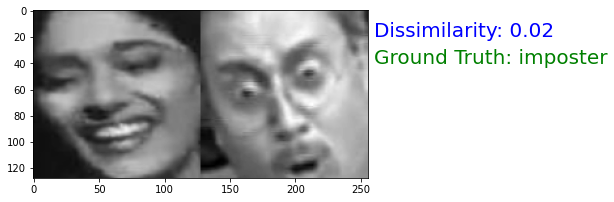

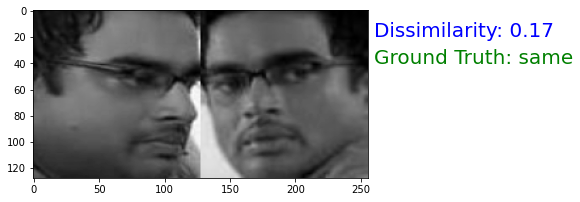

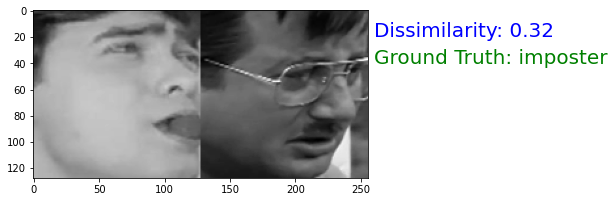

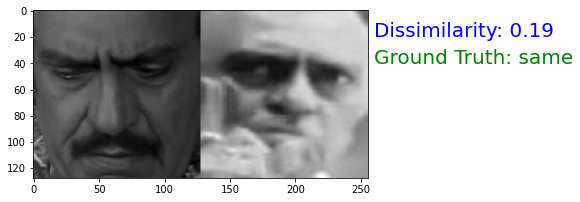

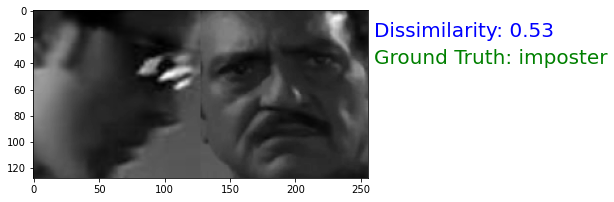

...

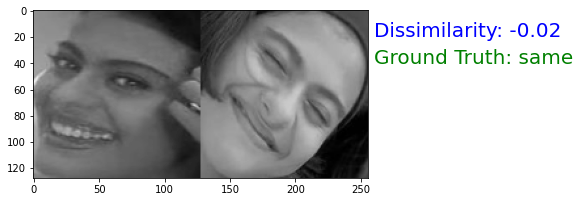

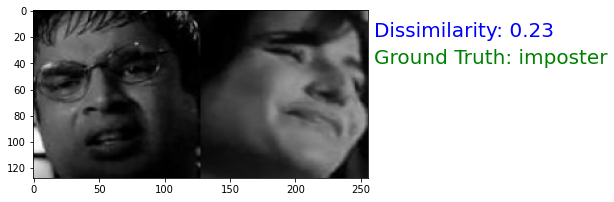

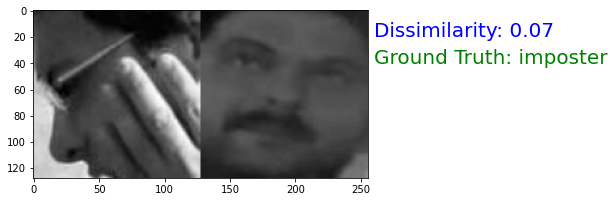

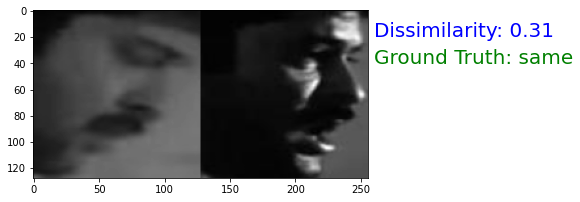

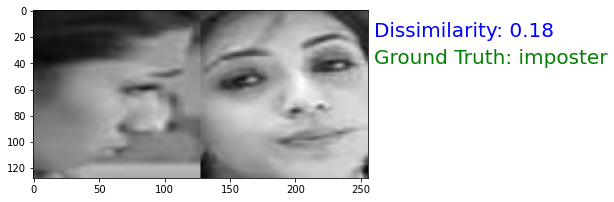

In [ ]:
# Extract testloader for a batch_size of 1
testloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = 'data/IMFDB_final/', image_list = test_list_file, crop=False, mirror=False, 
                                                             resize = True, resize_shape=[128,128]), batch_size=1, shuffle = False, pin_memory=False)

lab = ['same', 'imposter']
with torch.no_grad():
    for batch_idx, (inputs_1, inputs_2, targets) in enumerate(testloader):
        if batch_idx%10 == 0 or int(targets)==0:      # Show every tenth image or if its the same individual
            inputs_1, inputs_2, targets = inputs_1.to(device), inputs_2.to(device), targets.to(device)
            
            # Extract features of images inputs_1 and inputs_2
            features_1 = model(inputs_1)[1]
            features_2 = model(inputs_2)[1]

            # Use cosine similarity to measure the similarity between given two images
            dissimilarity = torch.nn.functional.cosine_similarity(features_1, features_2).item()

            # Both the images are combined horizontally (axis = 1)
            img = np.concatenate((inputs_1.data.cpu().numpy()[0][0], inputs_2.data.cpu().numpy()[0][0]), axis = 1)

            # Plot the concatenated image
            plt.imshow(img, cmap='gray')
            plt.text(260, 20, 'Dissimilarity: {:.2f}'.format(dissimilarity), fontsize=20, color='b')     # Similarity score
            plt.text(260, 40, "Ground Truth: {}".format(lab[int(targets.data[0])]), fontsize=20, color='g')   # Ground truth
            plt.show()

### Classification

Now we use this network for feature extraction and train an MLP classifier. Feature_net is not updated /train/ tweak after this. We only train the MLP classifier.

In [ ]:
from data_loader import custom_data_loader

train_list_file = 'data/IMFDB_train.txt'   # 5000 images for training
test_list_file = 'data/IMFDB_test.txt'     # 1095 images for validation

trainloader = torch.utils.data.DataLoader(custom_data_loader(img_root = 'data/IMFDB_final/', image_list = train_list_file, crop=False,
                                                             resize = True, resize_shape=[128,128]), batch_size=32, shuffle = True, pin_memory=False)

testloader = torch.utils.data.DataLoader(custom_data_loader(img_root = 'data/IMFDB_final/', image_list = test_list_file, crop=False, mirror=False, 
                                                             resize = True, resize_shape=[128,128]), batch_size=10, shuffle = False, pin_memory=False)

#### Build a Classifier

In [ ]:
classifier = nn.Sequential(nn.Linear(256, 64), nn.BatchNorm1d(64), nn.ReLU(),
                           nn.Linear(64, 32), nn.BatchNorm1d(32), nn.ReLU(),
                           nn.Linear(32, num_of_classes))

classifier = classifier.to(device)
print(classifier)

#### Train the Classifier

In [ ]:
def train_classifier(epoch):
    print('\nEpoch: %d' % epoch)
    classifier.train()
    train_loss = 0
    correct = 0
    total = 0
    for batch_idx, (inputs, targets) in enumerate(trainloader):
        inputs, targets = inputs.to(device), targets.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        features = model(inputs)[1]
        outputs = classifier(features)
        size_ = outputs.size()
        outputs_ = outputs.view(size_[0], num_of_classes)
        loss = criterion(outputs_, targets)
        loss.backward()
        optimizer.step()

        train_loss += loss.data
        _, predicted = torch.max(outputs_.data, 1)
        total += targets.size(0)
        correct += predicted.eq(targets.data).cpu().sum()

#### Test the Classifier

In [ ]:
# When the running accuracy is greater than the best_acc the respective trained model will be stored under the checkpoint folder
best_acc = 0

def test_classifier(epoch):
    global best_acc
    classifier.eval()
    test_loss = 0
    correct = 0
    total = 0
    for batch_idx, (inputs, targets) in enumerate(testloader):
        inputs, targets = inputs.to(device), targets.to(device)
        features = model(inputs)[1]
        
        outputs = classifier(features)
        size_ = outputs.size()
        outputs_ = outputs.view(size_[0], num_of_classes)
        loss = criterion(outputs_, targets)

        test_loss += loss.item()
        _, predicted = torch.max(outputs_.data, 1)
        total += targets.size(0)
        correct += predicted.eq(targets.data).cpu().sum()
               
    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        torch.save(classifier.state_dict(), 'data/checkpoint/classifier_ckpt.t7')
        best_acc = acc
    
    return test_loss/len(testloader)

In [ ]:
optimizer = optim.Adam(classifier.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=2, verbose=True)   # Dynamic LR scheduler
for epoch in range(0, 30):
    train_classifier(epoch)
    test_loss = test_classifier(epoch)
    scheduler.step(test_loss)
    print("Test Loss: ", test_loss)

### References

1. https://hackernoon.com/one-shot-learning-with-siamese-networks-in-pytorch-8ddaab10340e
2. https://www.iflexion.com/blog/face-recognition-algorithms-work/
3. http://cvit.iiit.ac.in/projects/IMFDB/

# Please answer the questions below to complete the experiment:

In [37]:
#@title State True or False: The Siamese data loader gives an image and  its label as input to the Siamese network (where the label is of the class that the image belongs to) ? { run: "auto", form-width: "500px", display-mode: "form" }
Answer = "False" #@param ["","True","False"]


In [38]:
#@title How was the experiment? { run: "auto", form-width: "500px", display-mode: "form" }
Complexity = "Good and Challenging for me" #@param ["","Too Simple, I am wasting time", "Good, But Not Challenging for me", "Good and Challenging for me", "Was Tough, but I did it", "Too Difficult for me"]


In [39]:
#@title If it was too easy, what more would you have liked to be added? If it was very difficult, what would you have liked to have been removed? { run: "auto", display-mode: "form" }
Additional = "Everything is good" #@param {type:"string"}


In [40]:
#@title Can you identify the concepts from the lecture which this experiment covered? { run: "auto", vertical-output: true, display-mode: "form" }
Concepts = "Yes" #@param ["","Yes", "No"]


In [41]:
#@title  Experiment walkthrough video? { run: "auto", vertical-output: true, display-mode: "form" }
Walkthrough = "Very Useful" #@param ["","Very Useful", "Somewhat Useful", "Not Useful", "Didn't use"]


In [42]:
#@title  Text and image description/explanation and code comments within the experiment: { run: "auto", vertical-output: true, display-mode: "form" }
Comments = "Very Useful" #@param ["","Very Useful", "Somewhat Useful", "Not Useful", "Didn't use"]


In [43]:
#@title Mentor Support: { run: "auto", vertical-output: true, display-mode: "form" }
Mentor_support = "Very Useful" #@param ["","Very Useful", "Somewhat Useful", "Not Useful", "Didn't use"]


In [44]:
#@title Run this cell to submit your notebook for grading { vertical-output: true }
try:
  if submission_id:
      return_id = submit_notebook()
      if return_id : submission_id = return_id
  else:
      print("Please complete the setup first.")
except NameError:
  print ("Please complete the setup first.")

Your submission is successful.
Ref Id: 3697
Date of submission:  16 Oct 2022
Time of submission:  15:50:27
View your submissions: https://aiml.iiith.talentsprint.com/notebook_submissions
